In [1]:
import os
from glob import glob
import numpy as np
import dask
import xarray as xr
import cartopy.crs as ccrs
from cmocean import cm
import xgcm

from matplotlib import pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = 20, 12

from mitequinox.utils import *

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/cmocean/tools.py:76: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not mpl.cbook.is_string_like(rgbin[0]):


In [2]:
from dask_jobqueue import PBSCluster
local_dir = os.getenv('TMPDIR')
cluster = PBSCluster(local_directory=local_dir)
#print(cluster.job_script())
w = cluster.start_workers(35)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/utils.py:128: RuntimeWarning: Couldn't detect a suitable IP address for reaching '8.8.8.8', defaulting to '127.0.0.1': [Errno 101] Network is unreachable
  % (host, default, e), RuntimeWarning)


In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [4]:
client

Client Scheduler: tcp://10.148.1.12:36678 Dashboard: http://10.148.1.12:8787/status,Cluster Workers: 70 Cores: 280 Memory: 3500.00 GB


_________
# Read dataset


In [5]:
Nf = 3
data_dir = '/home1/scratch/xyu/mit_nc_t/'


filenames_SSU = sorted(glob(data_dir+'SSU_*.nc'))
filenames_SSU = filenames_SSU[:Nf]
ds_SSU = xr.open_mfdataset(filenames_SSU, concat_dim='time', compat='equals')

filenames_SSV = sorted(glob(data_dir+'SSV_*.nc'))
filenames_SSV = filenames_SSV[:Nf]
ds_SSV = xr.open_mfdataset(filenames_SSV, concat_dim='time', compat='equals')

filenames_SST = sorted(glob(data_dir+'SST_*.nc'))
filenames_SST = filenames_SST[:Nf]
ds_SST = xr.open_mfdataset(filenames_SST, concat_dim='time', compat='equals')

grid = xr.open_dataset('/home1/scratch/xyu/mit_grid.nc', decode_coords=True)


In [6]:
ds = xr.merge([ds_SSU, ds_SSV, ds_SST, grid])
print(ds)

<xarray.Dataset>
Dimensions:  (face: 13, i: 4320, i_g: 4320, j: 4320, j_g: 4320, time: 3)
Coordinates:
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06
    dtime    (time) datetime64[ns] dask.array<shape=(3,), chunksize=(1,)>
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    XC       (face, j, i) float32 ...
    YC       (face, j, i) float32 ...
    XG       (face, j_g, i_g) float32 ...
    YG       (face, j_g, i_g) float32 ...
    rA       (face, j, i) float32 ...
    dxG      (face, j_g, i) float32 ...
    dyG      (face, j, i_g) float32 ...
    Depth    (face, j, i) float32 ...
    rAz      (face, j_g, i_g) float32 ...
    dxC      (face, j, i_g) float32

In [7]:
def quick_llc_plot(data, axis_off=False, **kwargs):
    face_to_axis = {0: (2, 0), 1: (1, 0), 2: (0, 0),
                    3: (2, 1), 4: (1, 1), 5: (0, 1),
                    7: (0, 2), 8: (1, 2), 9: (2, 2),
                    10: (0, 3), 11: (1, 3), 12: (2, 3)}
    transpose = [7, 8, 9, 10, 11, 12]
    gridspec_kw = dict(left=0, bottom=0, right=4, top=4, wspace=0, hspace=0)
    fig, axes = plt.subplots(nrows=3, ncols=4, gridspec_kw=gridspec_kw)
    for face, (j, i) in face_to_axis.items():
        data_ax = data.isel(face=face)
        ax = axes[j,i]
        yincrease = True
        if face in transpose:
            data_ax = data_ax.transpose()
            yincrease = False
        data_ax.plot(ax=ax, yincrease=yincrease, **kwargs)
        if axis_off:
            ax.axis('off')
        ax.set_title('')

---


# 1.1 mask SST>0

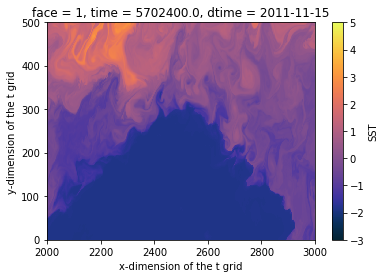

In [10]:
SST = ds['SST'].isel(face=1, time=0, i=slice(2000,3000), j=slice(0,500))
SST.plot(vmin=-3, vmax=5, cmap = cm.thermal)

In [13]:
mask = SST > 0
print(mask)

<xarray.DataArray 'SST' (j: 500, i: 1000)>
dask.array<shape=(500, 1000), dtype=bool, chunksize=(500, 1000)>
Coordinates:
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    face     int64 1
    time     float64 5.702e+06
    dtime    datetime64[ns] dask.array<shape=(), chunksize=()>
  * i        (i) int64 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 ...
    XC       (j, i) float32 ...
    YC       (j, i) float32 ...
    rA       (j, i) float32 ...
    Depth    (j, i) float32 ...


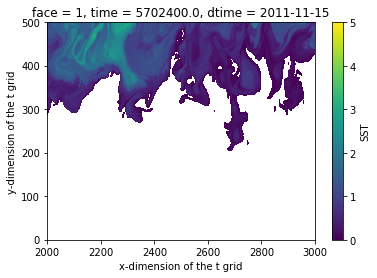

In [14]:
S = SST.where(mask)
S.plot(vmin=0, vmax=5)

In [12]:
ds['SST'].isel(face=1, time=0, i=slice(2000,3000), j=slice(0,200)).mean(dim=['i','j']).compute()

<xarray.DataArray 'SST' ()>
array(-1.593756, dtype=float32)
Coordinates:
    face     int64 1
    time     float64 5.702e+06
    dtime    datetime64[ns] 2011-11-15

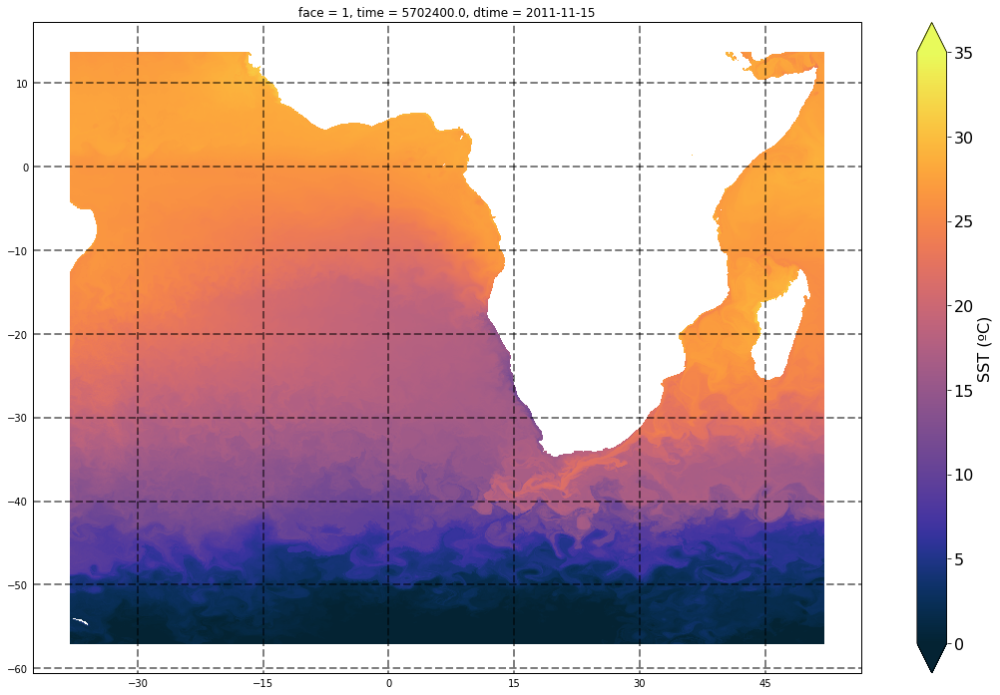

In [11]:
SST = ds['SST'].isel(face=1, time=0)

fig = plt.figure(figsize=(20,12))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())

cax = SST.plot.pcolormesh(ax=ax, x='XC', y='YC', transform=ccrs.PlateCarree(), vmin=0, vmax=35, add_colorbar = False, cmap = cm.thermal)
gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', alpha=0.5, linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False

plt.ylabel('Latitude',fontsize=16)
plt.xlabel('Longitude',fontsize=16)
ax.tick_params(labelsize=16)

cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical')
cbar.ax.tick_params(labelsize=16)
cbar.set_label('SST (ºC)', fontsize=16)


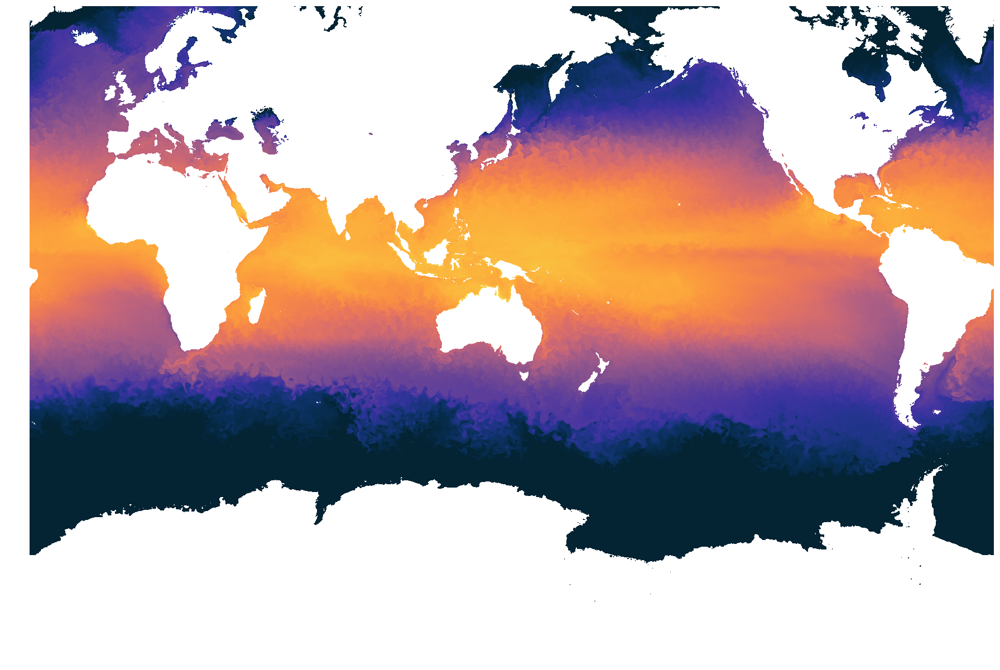

distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.1:34348 remote=tcp://10.148.1.1:49830>


In [13]:
quick_llc_plot(ds['SST'].isel(time=0), vmin=0, vmax=35, add_colorbar=False, axis_off=True, cmap = cm.thermal)

# 1.2 face connections

In [8]:
face_connections = {'face': {0: {'X': ((12, 'Y', False), (3, 'X', False)),
                                 'Y': (None, (1, 'Y', False))},
                             1: {'X': ((11, 'Y', False), (4, 'X', False)),
                                 'Y': ((0, 'Y', False), (2, 'Y', False))},
                             2: {'X': ((10, 'Y', False), (5, 'X', False)),
                                 'Y': ((1, 'Y', False), (6, 'X', False))},
                             3: {'X': ((0, 'X', False), (9, 'Y', False)),
                                 'Y': (None, (4, 'Y', False))},
                             4: {'X': ((1, 'X', False), (8, 'Y', False)),
                                 'Y': ((3, 'Y', False), (5, 'Y', False))},
                             5: {'X': ((2, 'X', False), (7, 'Y', False)),
                                 'Y': ((4, 'Y', False), (6, 'Y', False))},
                             6: {'X': ((2, 'Y', False), (7, 'X', False)),
                                 'Y': ((5, 'Y', False), (10, 'X', False))},
                             7: {'X': ((6, 'X', False), (8, 'X', False)),
                                 'Y': ((5, 'X', False), (10, 'Y', False))},
                             8: {'X': ((7, 'X', False), (9, 'X', False)),
                                 'Y': ((4, 'X', False), (11, 'Y', False))},
                             9: {'X': ((8, 'X', False), None),
                                 'Y': ((3, 'X', False), (12, 'Y', False))},
                             10: {'X': ((6, 'Y', False), (11, 'X', False)),
                                  'Y': ((7, 'Y', False), (2, 'X', False))},
                             11: {'X': ((10, 'X', False), (12, 'X', False)),
                                  'Y': ((8, 'Y', False), (1, 'X', False))},
                             12: {'X': ((11, 'X', False), None),
                                  'Y': ((9, 'Y', False), (0, 'X', False))}}}

In [9]:
x_grid = xgcm.Grid(ds, face_connections=face_connections)
print(x_grid)

<xgcm.Grid>
X Axis (periodic):
  * center   i (4320) --> left
  * left     i_g (4320) --> center
Y Axis (periodic):
  * center   j (4320) --> left
  * left     j_g (4320) --> center


In [10]:
#import xgcm
grid = xgcm.Grid(ds, periodic=['X', 'Y'])
grid

<xgcm.Grid>
X Axis (periodic):
  * center   i (4320) --> left
  * left     i_g (4320) --> center
Y Axis (periodic):
  * center   j (4320) --> left
  * left     j_g (4320) --> center

# 1.3 Horizontal advection

In [13]:
sst_i = grid.interp(ds['SST'],'X')
dFx_di = grid.diff(sst_i*ds.dyG*ds['SSU'],'X')/ds.rA
print(dFx_di)

<xarray.DataArray (time: 3, face: 13, j: 4320, i: 4320)>
dask.array<shape=(3, 13, 4320, 4320), dtype=float32, chunksize=(1, 13, 4320, 1)>
Coordinates:
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    XC       (face, j, i) float32 ...
    YC       (face, j, i) float32 ...
    rA       (face, j, i) float32 ...
    Depth    (face, j, i) float32 ...


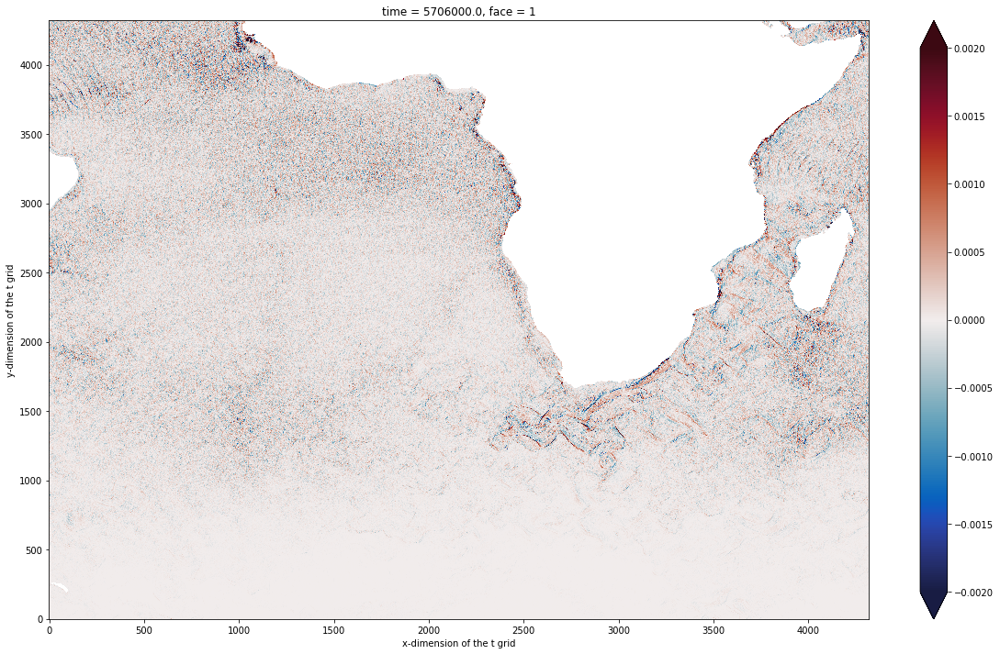

In [17]:
fig = plt.figure(figsize=(20,12))
dFx_di.isel(time=1,face=1).plot(vmin=-0.002, vmax=0.002, cmap=cm.balance)

In [11]:
sst_j = grid.interp(ds['SST'],'Y')
dFy_dj = grid.diff(sst_j*ds.dxG*ds['SSV'],'Y')/ds.rA
print(dFy_dj)

<xarray.DataArray (time: 3, face: 13, j: 4320, i: 4320)>
dask.array<shape=(3, 13, 4320, 4320), dtype=float32, chunksize=(1, 13, 1, 4320)>
Coordinates:
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    XC       (face, j, i) float32 ...
    YC       (face, j, i) float32 ...
    rA       (face, j, i) float32 ...
    Depth    (face, j, i) float32 ...


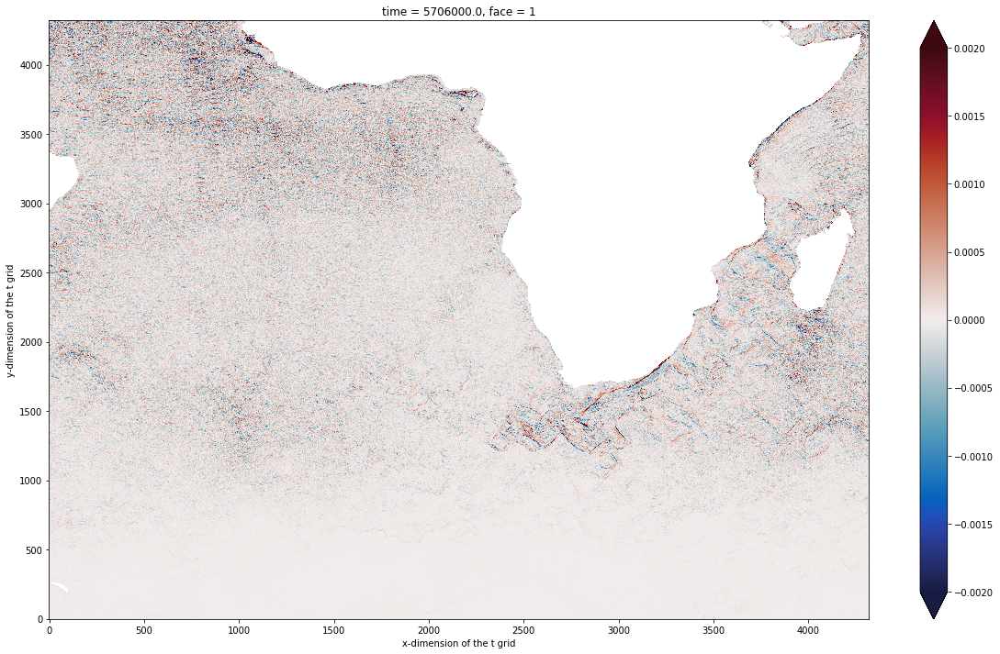

In [19]:
fig = plt.figure(figsize=(20,12))
dFy_dj.isel(time=1,face=1).plot(vmin=-0.002, vmax=0.002, cmap=cm.balance)

In [14]:
G_adv = (dFx_di + dFy_dj)
print(G_adv)

<xarray.DataArray (time: 3, face: 13, j: 4320, i: 4320)>
dask.array<shape=(3, 13, 4320, 4320), dtype=float32, chunksize=(1, 13, 1, 1)>
Coordinates:
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    XC       (face, j, i) float32 -114.93228 -114.93217 -114.93205 ...
    YC       (face, j, i) float32 -88.17715 -88.18007 -88.18299 -88.185905 ...
    rA       (face, j, i) float32 155492.97 155503.03 155513.17 155523.31 ...
    Depth    (face, j, i) float32 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ...


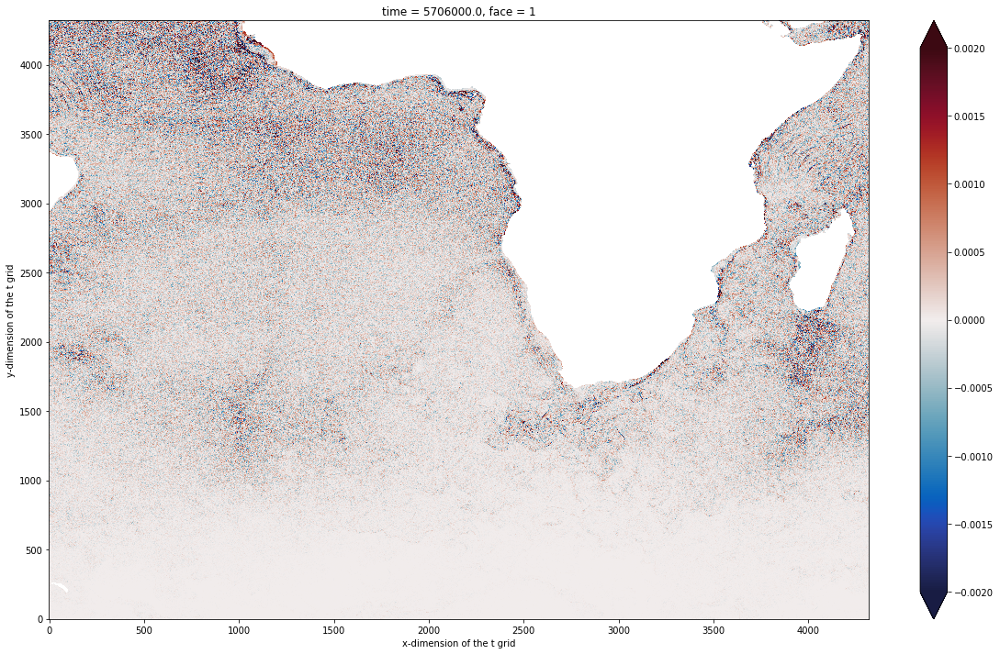

In [21]:
fig = plt.figure(figsize=(20,12))
G_adv.isel(time=1,face=1).plot(vmin=-0.002, vmax=0.002, cmap=cm.balance)

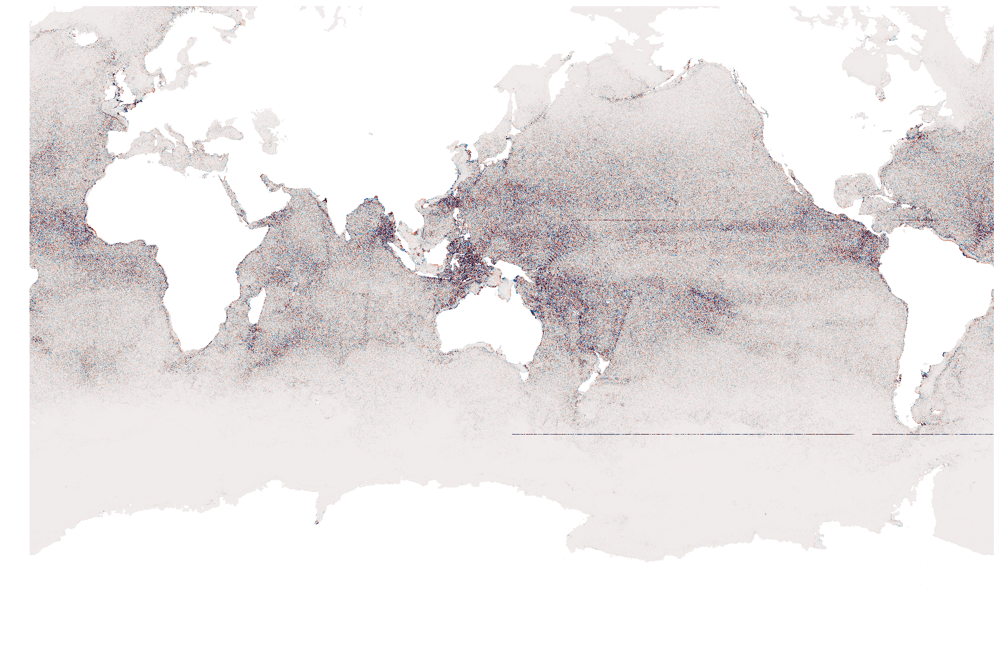

In [24]:
quick_llc_plot(G_adv.isel(time=1), vmin=-0.002, vmax=0.002, cmap=cm.balance, add_colorbar=False, axis_off=True)

# 1.4 Horizontal divergence

In [15]:
SSV_dxG = ds.dxG * ds['SSV']
SSU_dyG = ds.dyG * ds['SSU']

In [16]:
vel_div_components = grid.diff_2d_vector({'X': SSU_dyG, 'Y': SSV_dxG}, boundary='extend')
print(vel_div_components)

{'X': <xarray.DataArray 'sub-3f2bf90b17ea0421d87f73ed8338ae1f' (face: 13, j: 4320, i: 4320, time: 3)>
dask.array<shape=(13, 4320, 4320, 3), dtype=float32, chunksize=(13, 4320, 4319, 1)>
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06, 'Y': <xarray.DataArray 'sub-952ebede90a6a54793810d7ab7f14bed' (face: 13, j: 4320, i: 4320, time: 3)>
dask.array<shape=(13, 4320, 4320, 3), dtype=float32, chunksize=(13, 4319, 4320, 1)>
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06}


In [17]:
vel_div = (vel_div_components['X'] + vel_div_components['Y'])/ds.rA

In [ ]:
T_vel_div = (ds['SST'] * vel_div)
print(T_vel_div)

In [ ]:
quick_llc_plot(T_vel_div.isel(time=1), vmin=-0.002, vmax=0.002, cmap=cm.balance, add_colorbar=False, axis_off=True)

# 1.5 'Real' horizontal advection of T

In [18]:
G_adv_real = (G_adv - T_vel_div).load()

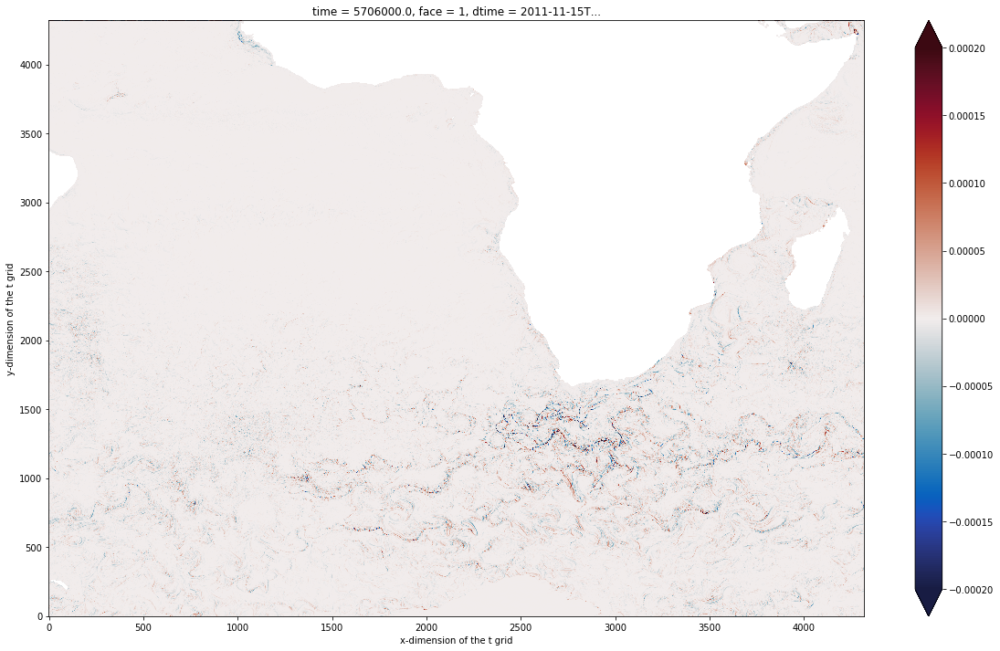

In [22]:
fig = plt.figure(figsize=(20,12))
G_adv_real.isel(time=1,face=1).plot(vmin=-0.0002, vmax=0.0002, cmap=cm.balance)

distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.1:39849 remote=tcp://10.148.1.1:33848>


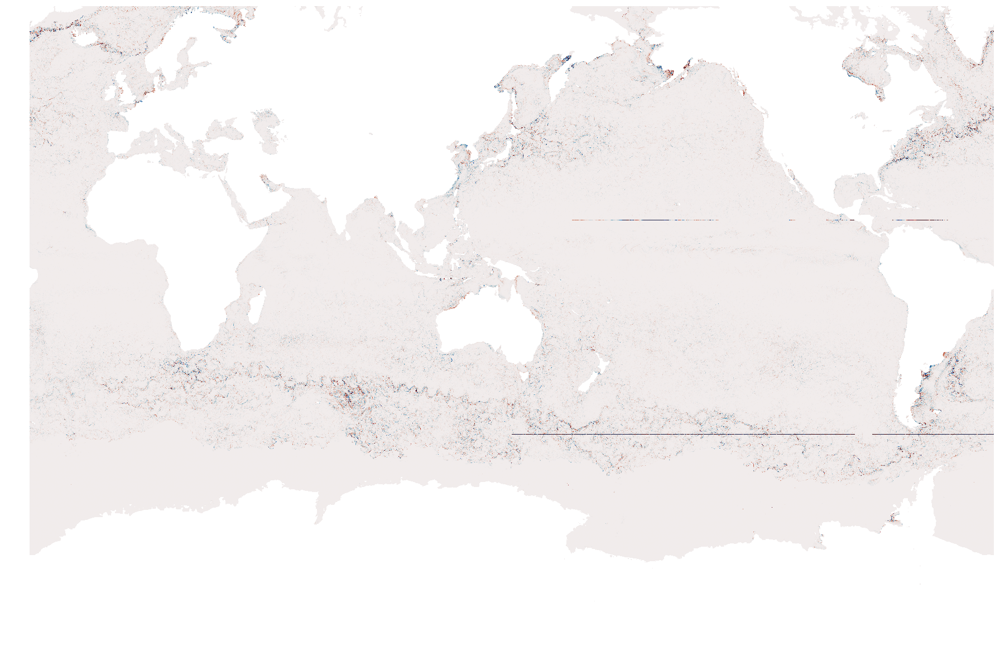

In [31]:
quick_llc_plot(G_adv_real.isel(time=1), vmin=-0.0002, vmax=0.0002, cmap=cm.balance, add_colorbar=False, axis_off=True)

# 2. Time derivative of SST

A central difference is applied to compute dT/dt.

In [19]:
SST_time2 = ds['SST'].isel(time=2)
print(SST_time2)

<xarray.DataArray 'SST' (face: 13, j: 4320, i: 4320)>
dask.array<shape=(13, 4320, 4320), dtype=float32, chunksize=(13, 4320, 4320)>
Coordinates:
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    time     float64 5.71e+06
    dtime    datetime64[ns] dask.array<shape=(), chunksize=()>
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    XC       (face, j, i) float32 ...
    YC       (face, j, i) float32 ...
    rA       (face, j, i) float32 ...
    Depth    (face, j, i) float32 ...


In [20]:
SST_time0 = ds['SST'].isel(time=0)
print(SST_time0)

<xarray.DataArray 'SST' (face: 13, j: 4320, i: 4320)>
dask.array<shape=(13, 4320, 4320), dtype=float32, chunksize=(13, 4320, 4320)>
Coordinates:
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    time     float64 5.702e+06
    dtime    datetime64[ns] dask.array<shape=(), chunksize=()>
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
    XC       (face, j, i) float32 ...
    YC       (face, j, i) float32 ...
    rA       (face, j, i) float32 ...
    Depth    (face, j, i) float32 ...


In [21]:
d_SST_dt_time1 = ((SST_time2 - SST_time0)/2/3600).load()

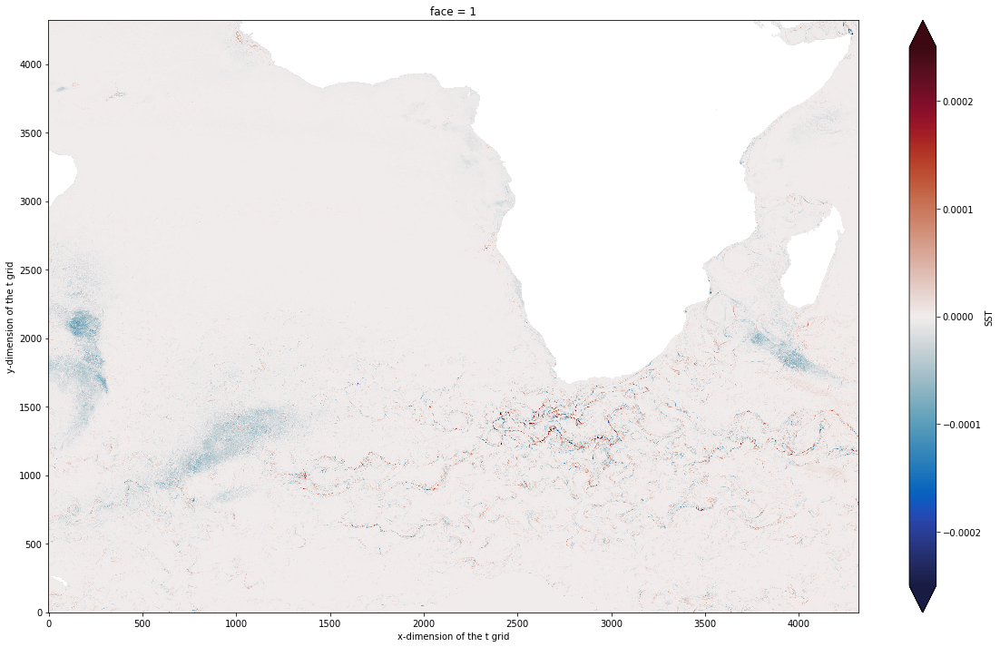

In [28]:
fig = plt.figure(figsize=(20,12))
d_SST_dt_time1.isel(face=1).plot(vmin=-0.0002, vmax=0.0002, cmap = cm.balance)

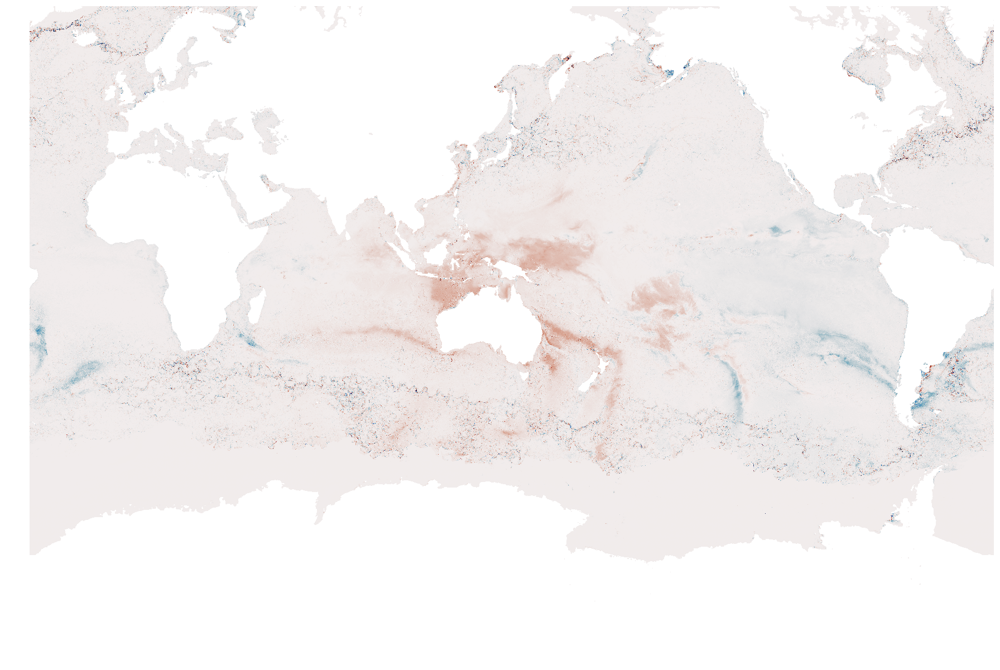

In [37]:
quick_llc_plot(d_SST_dt_time1, vmin=-0.0002, vmax=0.0002, cmap=cm.balance, add_colorbar=False, axis_off=True)

# Residuals

In [22]:
residual_sst_time1 = (d_SST_dt_time1 + G_adv_real.isel(time=1)).load()

In [23]:
p1 = (residual_sst_time1/d_SST_dt_time1).load()

In [24]:
p2 = (residual_sst_time1/G_adv_real).load()

In [ ]:
p1.isel(face=1).plot(vmin=-1., vmax=1.)

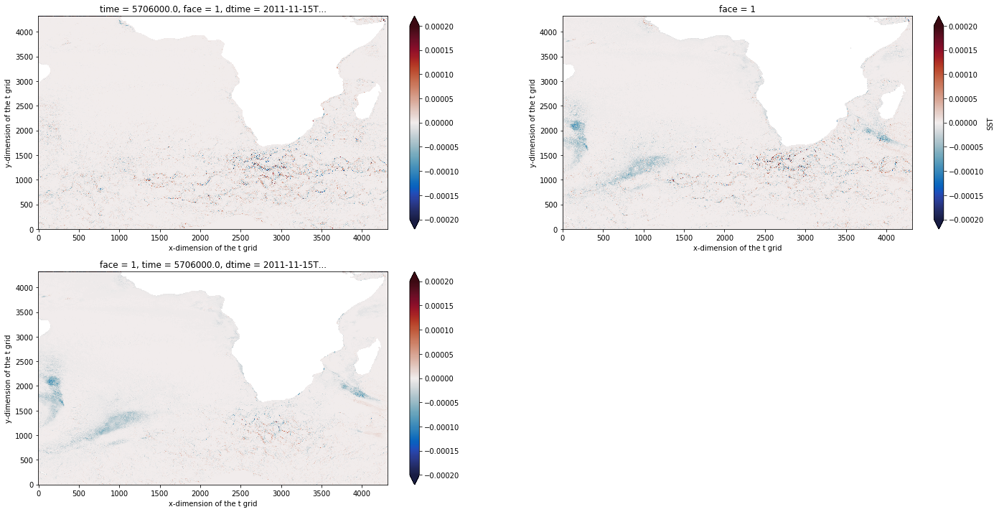

In [26]:
fig = plt.figure(figsize = (24,12))

plt.subplot(221)
G_adv_real.isel(time=1,face=1).plot(vmin=-0.0002, vmax=0.0002, cmap = cm.balance)
plt.subplot(222)
d_SST_dt_time1.isel(face=1).plot(vmin=-0.0002, vmax=0.0002, cmap = cm.balance)
plt.subplot(223)
residual_sst_time1.isel(face=1).plot(vmin=-0.0002, vmax=0.0002, cmap = cm.balance)


distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.1:39595 remote=tcp://10.148.1.1:33848>


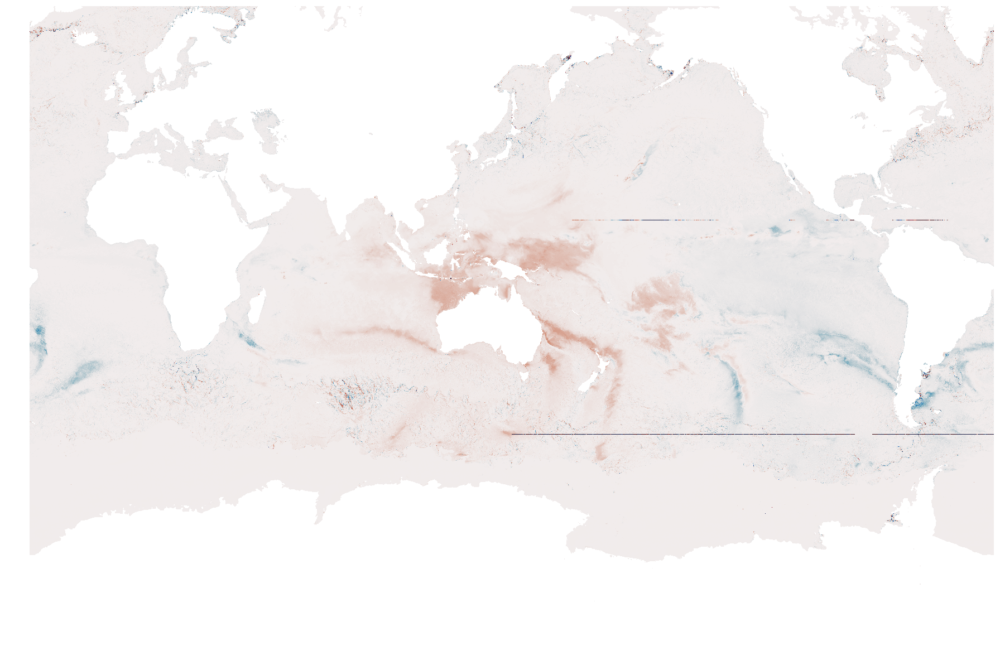

In [27]:
quick_llc_plot(residual_sst_time1, vmin=-0.0002, vmax=0.0002, cmap=cm.balance, add_colorbar=False, axis_off=True)

In [33]:
cluster.scheduler.close()

<Future finished result=None>